In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
plt.style.use('dark_background')
import matplotlib as mpl
mpl.rcParams["animation.html"] = "jshtml"  # render animations as HTML
from matplotlib.collections import LineCollection

In [29]:
def animate_lc_custom(time, y, yerr, save_animation=False, **kwargs):
    def setup_plotter(x, y, yerr):
        fig, ax = plt.subplots(figsize=(6, 3))
        (line,) = ax.plot([], [], ".", alpha=0.8)

        err_lc = LineCollection([], linewidths=0.8, alpha=0.8)
        ax.add_collection(err_lc)

        ax.set_xlim(np.min(x), np.max(x))
        y_zoom = 0.1
        ax.set_ylim(np.min(y)-y_zoom, np.max(y)+y_zoom)
        ax.set_xlabel("Time")
        ax.set_ylabel("Flux")
        ax.set_title("Progressive reveal of light curve")

        return fig, ax, line, err_lc

    fig, ax, line, err_lc = setup_plotter(time, y, yerr)

    def init():
        line.set_data([], [])
        err_lc.set_segments([])
        return line, err_lc

    def update(frame):
        xs = time[:frame]
        ys = y[:frame]
        es = yerr[:frame]
        line.set_data(xs, ys)

        # Build vertical segments: [ [(x, y-e), (x, y+e)], ... ]
        segs = np.array([[(xi, yi - ei), (xi, yi + ei)]
                        for xi, yi, ei in zip(xs, ys, es)], dtype=float)
        err_lc.set_segments(segs)

        return line, err_lc

    ani = FuncAnimation(
        fig,
        update,
        frames=len(time) + 1,
        init_func=init,
        blit=True,
        **kwargs
    )

    if save_animation:
        ani.save("light_curve_animation.mp4", writer="ffmpeg")

    return ani

<ErrorbarContainer object of 3 artists>

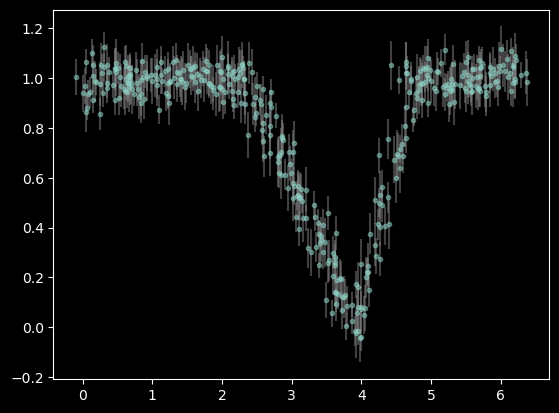

In [24]:
N = 400
time = np.linspace(0, 2*np.pi, N) + np.random.normal(0, 0.1, N)

# a flat light curve then a sudden assymetric dip
y = np.ones(N)
y[150:250] -= np.linspace(0, 1, 100)
y[250:300] -= np.linspace(1, 0, 50)
y += np.random.normal(0, 0.05, N)
yerr = 0.05 + 0.05 * np.random.rand(N)

plt.errorbar(time, y, yerr=yerr, fmt='.', ecolor='gray', alpha=0.5)

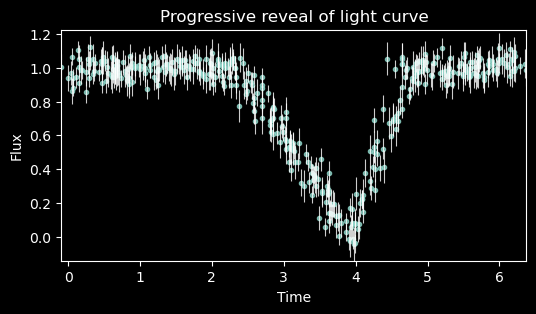

In [26]:
animate_lc_custom(time, y, yerr, interval=10)